## Configuración inicial

A continuación se importan las librerías necesarias para el funcionamiento del notebook. 

In [1]:
#!pip install -r requirements.txt

In [2]:
#plots and data
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

#metrics and transformations
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn.metrics import mean_squared_error
from sklearn import metrics

#Model 
import xgboost as xgb

sns.set()

In [3]:
def plot_predict_test(df_test_y,testPredict,lag):
        ### Resultado predicción datos de entrenamiento
    fig, ax = plt.subplots(figsize=[15,8])
    sns.lineplot(df_test_y.flatten(),label="real")
    sns.lineplot(testPredict.flatten(),label="predicción")
    plt.title("Comparación valor real y predicción")
    plt.ylabel("value")

In [4]:
def createLagFeature(name_features,lag,df):
    for name_feature in name_features:
        for i in range(1,lag+1):
            df[name_feature+"lag"+str(i)]=df[name_feature].shift(i)
    return df

In [5]:
#function to measure the performance
def timeseries_evaluation_metrics_func(y_true, y_pred,flag):
    def mean_absolute_percentage_error(y_true, y_pred): 
        epsilon=0.1e-5
        y_true, y_pred = np.array(y_true), np.array(y_pred)
        return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
    
    if flag : print(f'R2 is : {metrics.r2_score(y_true, y_pred)}',end='\n\n')
    else:
        print('Evaluation metric results:')
        print(f'MSE is : {metrics.mean_squared_error(y_true, y_pred)}')
        print(f'MAE is : {metrics.mean_absolute_error(y_true, y_pred)}')
        print(f'RMSE is : {np.sqrt(metrics.mean_squared_error(y_true, y_pred))}')
        print(f'MAPE is : {mean_absolute_percentage_error(y_true, y_pred)}')
        
    return {"MSE":metrics.mean_squared_error(y_true, y_pred),
           "MAE":metrics.mean_absolute_error(y_true, y_pred),
           "RMSE":np.sqrt(metrics.mean_squared_error(y_true, y_pred)),
           "MAPE":mean_absolute_percentage_error(y_true, y_pred)}

---

## Cargar y preparar los datos.

In [3]:
df = pd.read_csv("../../Datasets/Datos_durante_pandemia/data_durante_vol_ve_in.csv")

df['Fecha'] = pd.to_datetime(df['Fecha'])
df = df.sort_values('Fecha', ascending=True)
df = df.rename(columns = {'Vol. Futuros': 'VolFuturos'})
df

,Fecha,VolFuturos,TRM,Precio Interno,VIX,EMV-ID,EPU
0,2020-01-01,1.289946,3277.14,975000.0,12.548403,1.89,186.06
1,2020-01-02,0.735046,3277.14,945000.0,12.470000,2.84,139.13
2,2020-01-03,0.591834,3258.84,940000.0,14.020000,1.33,108.10
3,2020-01-04,1.367154,3262.05,930000.0,14.646666,0.00,212.82
4,2020-01-05,1.505321,3262.05,920000.0,14.311970,0.86,173.76
...,...,...,...,...,...,...,...
913,2022-07-02,0.778572,4198.77,2270000.0,25.922916,11.11,130.95
914,2022-07-03,0.819483,4198.77,2270000.0,26.641413,23.06,135.95
915,2022-07-04,0.843804,4198.77,2270000.0,27.530000,15.98,309.83
916,2022-07-05,0.850985,4198.77,2280000.0,27.540000,18.90,116.59


---

## Desarrollo del modelo

In [7]:
#objects to scale the data 
sc=StandardScaler()
sc2=StandardScaler()

In [8]:
df_stats=df

In [9]:
#
len_data=df_stats.shape[0]

#get target
df_label=df_stats["VolFuturos"].values.reshape(len_data,1)
#get attributes
df_data=df_stats.drop(columns=["Fecha"])

#apply scale
#df_label=sc.fit_transform(df_label)
#df_data_normalize=sc2.fit_transform(df_data)


In [10]:
def Model(df_data,df_label,lag,estimators):
    delete_columns=list(df_data.columns)
    df_data_lags=createLagFeature(df_data.columns,lag,df_data) if lag>0 else df_data
    df_data_lags.drop(columns=delete_columns,inplace=True)
    df_data_lags=df_data_lags[lag:]
    #transform data
    df_data_lags=sc2.fit_transform(df_data_lags)
    
    #split data
    #last index of the train data
    seventy_percent=int(len_data*0.7)

    #split the data normalize
    df_train=df_data_lags[:seventy_percent]
    df_test=df_data_lags[seventy_percent:]

    #split labels
    df_label=df_label[lag:]
    df_train_y=df_label[:seventy_percent]
    df_test_y=df_label[seventy_percent:]
    #split labels normalize
    df_label_normalize=sc.fit_transform(df_label)
    df_train_y_normalize=df_label_normalize[:seventy_percent]
    df_test_y_normalize=df_label_normalize[seventy_percent:]
    
   
    #make model
    model=xgb.XGBRegressor(n_estimators=estimators
                        ,early_stopping_rounds=80)
    #fit the model with the train data
    
    history=model.fit(df_train,df_train_y_normalize,
          eval_set=[(df_train,df_train_y_normalize),(df_test,df_test_y_normalize)])
   
    # make predictions
    trainPredict = model.predict(df_train)
    trainPredict = np.reshape(trainPredict,(len(trainPredict),1))
    # invert transformation
    trainPredict = sc.inverse_transform(trainPredict)
    trainY = df_train_y
    
    # make predictions
    testPredict = model.predict(df_test)
    # invert transformation
    testPredict = np.reshape(testPredict,(len(testPredict),1))
    testPredict = sc.inverse_transform(testPredict)
    testY = df_test_y
    print("len test: ",testY.shape)
    print("len PREDICT: ",testPredict.shape)
    
    plot_predict_test(df_train_y,trainPredict,lag)
    plot_predict_test(df_test_y,testPredict,lag)
    return [{"Fecha":df_stats.Fecha[lag:][:seventy_percent],"typeXGBoost":["train"]*len(trainPredict.flatten()),"XGBoost" :trainPredict.flatten()}
            ,{"Fecha":df_stats.Fecha[lag:][seventy_percent:],"typeXGBoost":["test"]*len(testPredict.flatten()),"XGBoost":testPredict.flatten()}]
   
    return {"train":timeseries_evaluation_metrics_func(trainY.flatten()+1, trainPredict.flatten()+1,False),
           "test":timeseries_evaluation_metrics_func(testY.flatten()+1, testPredict.flatten()+1,False)}

## Resultados

[0]	validation_0-rmse:0.98074	validation_1-rmse:1.36433
[1]	validation_0-rmse:0.87496	validation_1-rmse:1.70728
[2]	validation_0-rmse:0.80591	validation_1-rmse:1.84718
[3]	validation_0-rmse:0.71706	validation_1-rmse:1.87416
[4]	validation_0-rmse:0.66745	validation_1-rmse:1.92687
[5]	validation_0-rmse:0.64361	validation_1-rmse:1.96820
[6]	validation_0-rmse:0.60415	validation_1-rmse:2.00439
[7]	validation_0-rmse:0.59069	validation_1-rmse:2.00147
[8]	validation_0-rmse:0.57645	validation_1-rmse:1.99696
[9]	validation_0-rmse:0.53369	validation_1-rmse:2.02108
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5018661647279994
MAE is : 0.999089988471432
RMSE is : 1.225506493139877
MAPE is : 56.426618597946586
Evaluation metric results:
MSE is : 2.9002183977289584
MAE is : 1.4632817936713687
RMSE is : 1.7030027591665724
MAPE is : 85.98681529931149
[0]	validation_0-rmse:0.98074	validation_1-rmse:1.36433
[1]	validation_0-rmse:0.87496	validation_1-rmse:1.70728
[2]	va

[23]	validation_0-rmse:0.25303	validation_1-rmse:2.09149
[24]	validation_0-rmse:0.23454	validation_1-rmse:2.08995
[25]	validation_0-rmse:0.22204	validation_1-rmse:2.09052
[26]	validation_0-rmse:0.21876	validation_1-rmse:2.11045
[27]	validation_0-rmse:0.21135	validation_1-rmse:2.13149
[28]	validation_0-rmse:0.19956	validation_1-rmse:2.14091
[29]	validation_0-rmse:0.19306	validation_1-rmse:2.14047
[30]	validation_0-rmse:0.18619	validation_1-rmse:2.14550
[31]	validation_0-rmse:0.17989	validation_1-rmse:2.14763
[32]	validation_0-rmse:0.17272	validation_1-rmse:2.15146
[33]	validation_0-rmse:0.16442	validation_1-rmse:2.15399
[34]	validation_0-rmse:0.15114	validation_1-rmse:2.16271
[35]	validation_0-rmse:0.14515	validation_1-rmse:2.18678
[36]	validation_0-rmse:0.14277	validation_1-rmse:2.18573
[37]	validation_0-rmse:0.13583	validation_1-rmse:2.18866
[38]	validation_0-rmse:0.12823	validation_1-rmse:2.18960
[39]	validation_0-rmse:0.12468	validation_1-rmse:2.20859
[40]	validation_0-rmse:0.11842	

[28]	validation_0-rmse:0.19956	validation_1-rmse:2.14091
[29]	validation_0-rmse:0.19306	validation_1-rmse:2.14047
[30]	validation_0-rmse:0.18619	validation_1-rmse:2.14550
[31]	validation_0-rmse:0.17989	validation_1-rmse:2.14763
[32]	validation_0-rmse:0.17272	validation_1-rmse:2.15146
[33]	validation_0-rmse:0.16442	validation_1-rmse:2.15399
[34]	validation_0-rmse:0.15114	validation_1-rmse:2.16271
[35]	validation_0-rmse:0.14515	validation_1-rmse:2.18678
[36]	validation_0-rmse:0.14277	validation_1-rmse:2.18573
[37]	validation_0-rmse:0.13583	validation_1-rmse:2.18866
[38]	validation_0-rmse:0.12823	validation_1-rmse:2.18960
[39]	validation_0-rmse:0.12468	validation_1-rmse:2.20859
[40]	validation_0-rmse:0.11842	validation_1-rmse:2.21194
[41]	validation_0-rmse:0.11598	validation_1-rmse:2.21092
[42]	validation_0-rmse:0.11134	validation_1-rmse:2.21235
[43]	validation_0-rmse:0.10680	validation_1-rmse:2.21278
[44]	validation_0-rmse:0.09734	validation_1-rmse:2.21385
[45]	validation_0-rmse:0.09224	

[0]	validation_0-rmse:0.98074	validation_1-rmse:1.36433
[1]	validation_0-rmse:0.87496	validation_1-rmse:1.70728
[2]	validation_0-rmse:0.80591	validation_1-rmse:1.84718
[3]	validation_0-rmse:0.71706	validation_1-rmse:1.87416
[4]	validation_0-rmse:0.66745	validation_1-rmse:1.92687
[5]	validation_0-rmse:0.64361	validation_1-rmse:1.96820
[6]	validation_0-rmse:0.60415	validation_1-rmse:2.00439
[7]	validation_0-rmse:0.59069	validation_1-rmse:2.00147
[8]	validation_0-rmse:0.57645	validation_1-rmse:1.99696
[9]	validation_0-rmse:0.53369	validation_1-rmse:2.02108
[10]	validation_0-rmse:0.49226	validation_1-rmse:2.02331
[11]	validation_0-rmse:0.45721	validation_1-rmse:2.00753
[12]	validation_0-rmse:0.42454	validation_1-rmse:2.01536
[13]	validation_0-rmse:0.40265	validation_1-rmse:2.06895
[14]	validation_0-rmse:0.39170	validation_1-rmse:2.07053
[15]	validation_0-rmse:0.36520	validation_1-rmse:2.06505
[16]	validation_0-rmse:0.35396	validation_1-rmse:2.05991
[17]	validation_0-rmse:0.33323	validation

<ipython-input-3-f7487097fa4e>:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=[15,8])


Evaluation metric results:
MSE is : 1.5018661647279994
MAE is : 0.999089988471432
RMSE is : 1.225506493139877
MAPE is : 56.426618597946586
Evaluation metric results:
MSE is : 2.9002183977289584
MAE is : 1.4632817936713687
RMSE is : 1.7030027591665724
MAPE is : 85.98681529931149
[0]	validation_0-rmse:0.98074	validation_1-rmse:1.36433
[1]	validation_0-rmse:0.87496	validation_1-rmse:1.70728
[2]	validation_0-rmse:0.80591	validation_1-rmse:1.84718
[3]	validation_0-rmse:0.71706	validation_1-rmse:1.87416
[4]	validation_0-rmse:0.66745	validation_1-rmse:1.92687
[5]	validation_0-rmse:0.64361	validation_1-rmse:1.96820
[6]	validation_0-rmse:0.60415	validation_1-rmse:2.00439
[7]	validation_0-rmse:0.59069	validation_1-rmse:2.00147
[8]	validation_0-rmse:0.57645	validation_1-rmse:1.99696
[9]	validation_0-rmse:0.53369	validation_1-rmse:2.02108
[10]	validation_0-rmse:0.49226	validation_1-rmse:2.02331
[11]	validation_0-rmse:0.45721	validation_1-rmse:2.00753
[12]	validation_0-rmse:0.42454	validation_1-rms

[12]	validation_0-rmse:0.48827	validation_1-rmse:3.19578
[13]	validation_0-rmse:0.43863	validation_1-rmse:3.17939
[14]	validation_0-rmse:0.42058	validation_1-rmse:3.19247
[15]	validation_0-rmse:0.40057	validation_1-rmse:3.30134
[16]	validation_0-rmse:0.38074	validation_1-rmse:3.30246
[17]	validation_0-rmse:0.36336	validation_1-rmse:3.29701
[18]	validation_0-rmse:0.34698	validation_1-rmse:3.40997
[19]	validation_0-rmse:0.31878	validation_1-rmse:3.41467
[20]	validation_0-rmse:0.31374	validation_1-rmse:3.41472
[21]	validation_0-rmse:0.30549	validation_1-rmse:3.45618
[22]	validation_0-rmse:0.28263	validation_1-rmse:3.46277
[23]	validation_0-rmse:0.27067	validation_1-rmse:3.45840
[24]	validation_0-rmse:0.25107	validation_1-rmse:3.47963
[25]	validation_0-rmse:0.23274	validation_1-rmse:3.49491
[26]	validation_0-rmse:0.22745	validation_1-rmse:3.56532
[27]	validation_0-rmse:0.21676	validation_1-rmse:3.56236
[28]	validation_0-rmse:0.21056	validation_1-rmse:3.56304
[29]	validation_0-rmse:0.20445	

[20]	validation_0-rmse:0.31374	validation_1-rmse:3.41472
[21]	validation_0-rmse:0.30549	validation_1-rmse:3.45618
[22]	validation_0-rmse:0.28263	validation_1-rmse:3.46277
[23]	validation_0-rmse:0.27067	validation_1-rmse:3.45840
[24]	validation_0-rmse:0.25107	validation_1-rmse:3.47963
[25]	validation_0-rmse:0.23274	validation_1-rmse:3.49491
[26]	validation_0-rmse:0.22745	validation_1-rmse:3.56532
[27]	validation_0-rmse:0.21676	validation_1-rmse:3.56236
[28]	validation_0-rmse:0.21056	validation_1-rmse:3.56304
[29]	validation_0-rmse:0.20445	validation_1-rmse:3.62015
[30]	validation_0-rmse:0.18969	validation_1-rmse:3.61737
[31]	validation_0-rmse:0.17922	validation_1-rmse:3.61627
[32]	validation_0-rmse:0.17575	validation_1-rmse:3.61553
[33]	validation_0-rmse:0.16634	validation_1-rmse:3.61075
[34]	validation_0-rmse:0.15865	validation_1-rmse:3.61314
[35]	validation_0-rmse:0.15211	validation_1-rmse:3.61181
[36]	validation_0-rmse:0.14410	validation_1-rmse:3.60212
[37]	validation_0-rmse:0.13885	

[23]	validation_0-rmse:0.27067	validation_1-rmse:3.45840
[24]	validation_0-rmse:0.25107	validation_1-rmse:3.47963
[25]	validation_0-rmse:0.23274	validation_1-rmse:3.49491
[26]	validation_0-rmse:0.22745	validation_1-rmse:3.56532
[27]	validation_0-rmse:0.21676	validation_1-rmse:3.56236
[28]	validation_0-rmse:0.21056	validation_1-rmse:3.56304
[29]	validation_0-rmse:0.20445	validation_1-rmse:3.62015
[30]	validation_0-rmse:0.18969	validation_1-rmse:3.61737
[31]	validation_0-rmse:0.17922	validation_1-rmse:3.61627
[32]	validation_0-rmse:0.17575	validation_1-rmse:3.61553
[33]	validation_0-rmse:0.16634	validation_1-rmse:3.61075
[34]	validation_0-rmse:0.15865	validation_1-rmse:3.61314
[35]	validation_0-rmse:0.15211	validation_1-rmse:3.61181
[36]	validation_0-rmse:0.14410	validation_1-rmse:3.60212
[37]	validation_0-rmse:0.13885	validation_1-rmse:3.60007
[38]	validation_0-rmse:0.13290	validation_1-rmse:3.60323
[39]	validation_0-rmse:0.12732	validation_1-rmse:3.59929
[40]	validation_0-rmse:0.11994	

len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5185937614031024
MAE is : 1.0035880738089469
RMSE is : 1.2323123635682238
MAPE is : 56.62989237507395
Evaluation metric results:
MSE is : 2.8589662642727296
MAE is : 1.450359132683455
RMSE is : 1.6908477945317046
MAPE is : 85.11988108091363
[0]	validation_0-rmse:0.98478	validation_1-rmse:1.35459
[1]	validation_0-rmse:0.87963	validation_1-rmse:1.68855
[2]	validation_0-rmse:0.80763	validation_1-rmse:2.11176
[3]	validation_0-rmse:0.74773	validation_1-rmse:2.51463
[4]	validation_0-rmse:0.70304	validation_1-rmse:2.56430
[5]	validation_0-rmse:0.64625	validation_1-rmse:2.56897
[6]	validation_0-rmse:0.61549	validation_1-rmse:2.80467
[7]	validation_0-rmse:0.60155	validation_1-rmse:2.90445
[8]	validation_0-rmse:0.56467	validation_1-rmse:3.01490
[9]	validation_0-rmse:0.54963	validation_1-rmse:3.01122
[10]	validation_0-rmse:0.52671	validation_1-rmse:3.03016
[11]	validation_0-rmse:0.49651	validation_1-rmse:3.20242
[12]	validation_0-rmse:0

[53]	validation_0-rmse:0.05502	validation_1-rmse:3.60210
[54]	validation_0-rmse:0.05178	validation_1-rmse:3.60198
[55]	validation_0-rmse:0.04850	validation_1-rmse:3.60237
[56]	validation_0-rmse:0.04696	validation_1-rmse:3.60252
[57]	validation_0-rmse:0.04567	validation_1-rmse:3.60297
[58]	validation_0-rmse:0.04396	validation_1-rmse:3.60349
[59]	validation_0-rmse:0.04155	validation_1-rmse:3.60227
[60]	validation_0-rmse:0.04018	validation_1-rmse:3.60128
[61]	validation_0-rmse:0.03859	validation_1-rmse:3.59909
[62]	validation_0-rmse:0.03690	validation_1-rmse:3.59948
[63]	validation_0-rmse:0.03467	validation_1-rmse:3.60066
[64]	validation_0-rmse:0.03380	validation_1-rmse:3.59825
[65]	validation_0-rmse:0.03277	validation_1-rmse:3.59728
[66]	validation_0-rmse:0.03089	validation_1-rmse:3.59679
[67]	validation_0-rmse:0.02961	validation_1-rmse:3.59460
[68]	validation_0-rmse:0.02891	validation_1-rmse:3.59410
[69]	validation_0-rmse:0.02727	validation_1-rmse:3.59481
[70]	validation_0-rmse:0.02620	

[9]	validation_0-rmse:0.48378	validation_1-rmse:2.48461
[10]	validation_0-rmse:0.46093	validation_1-rmse:2.48383
[11]	validation_0-rmse:0.43101	validation_1-rmse:2.62768
[12]	validation_0-rmse:0.40119	validation_1-rmse:2.63171
[13]	validation_0-rmse:0.36840	validation_1-rmse:2.61899
[14]	validation_0-rmse:0.35108	validation_1-rmse:2.61380
[15]	validation_0-rmse:0.33849	validation_1-rmse:2.72445
[16]	validation_0-rmse:0.30641	validation_1-rmse:2.73435
[17]	validation_0-rmse:0.29639	validation_1-rmse:2.72965
[18]	validation_0-rmse:0.28087	validation_1-rmse:2.72444
[19]	validation_0-rmse:0.26514	validation_1-rmse:2.71179
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5085208292620362
MAE is : 1.0013188703830915
RMSE is : 1.228218559240185
MAPE is : 56.459754633573986
Evaluation metric results:
MSE is : 2.8581162136575045
MAE is : 1.4502507550263801
RMSE is : 1.690596407679108
MAPE is : 85.11749628547585
[0]	validation_0-rmse:0.98208	validation_1-rmse:1.35

[47]	validation_0-rmse:0.05634	validation_1-rmse:2.96738
[48]	validation_0-rmse:0.05116	validation_1-rmse:2.96828
[49]	validation_0-rmse:0.04712	validation_1-rmse:2.96929
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5085208292620362
MAE is : 1.0013188703830915
RMSE is : 1.228218559240185
MAPE is : 56.459754633573986
Evaluation metric results:
MSE is : 2.8581162136575045
MAE is : 1.4502507550263801
RMSE is : 1.690596407679108
MAPE is : 85.11749628547585
[0]	validation_0-rmse:0.98208	validation_1-rmse:1.35439
[1]	validation_0-rmse:0.87599	validation_1-rmse:1.70005
[2]	validation_0-rmse:0.77333	validation_1-rmse:1.71464
[3]	validation_0-rmse:0.70817	validation_1-rmse:2.05716
[4]	validation_0-rmse:0.66816	validation_1-rmse:2.29524
[5]	validation_0-rmse:0.61171	validation_1-rmse:2.28875
[6]	validation_0-rmse:0.55947	validation_1-rmse:2.30343
[7]	validation_0-rmse:0.52161	validation_1-rmse:2.31687
[8]	validation_0-rmse:0.49903	validation_1-rmse:2.31661
[9]

len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5085208292620362
MAE is : 1.0013188703830915
RMSE is : 1.228218559240185
MAPE is : 56.459754633573986
Evaluation metric results:
MSE is : 2.8581162136575045
MAE is : 1.4502507550263801
RMSE is : 1.690596407679108
MAPE is : 85.11749628547585
[0]	validation_0-rmse:0.98208	validation_1-rmse:1.35439
[1]	validation_0-rmse:0.87599	validation_1-rmse:1.70005
[2]	validation_0-rmse:0.77333	validation_1-rmse:1.71464
[3]	validation_0-rmse:0.70817	validation_1-rmse:2.05716
[4]	validation_0-rmse:0.66816	validation_1-rmse:2.29524
[5]	validation_0-rmse:0.61171	validation_1-rmse:2.28875
[6]	validation_0-rmse:0.55947	validation_1-rmse:2.30343
[7]	validation_0-rmse:0.52161	validation_1-rmse:2.31687
[8]	validation_0-rmse:0.49903	validation_1-rmse:2.31661
[9]	validation_0-rmse:0.48378	validation_1-rmse:2.48461
[10]	validation_0-rmse:0.46093	validation_1-rmse:2.48383
[11]	validation_0-rmse:0.43101	validation_1-rmse:2.62768
[12]

[53]	validation_0-rmse:0.04172	validation_1-rmse:2.97028
[54]	validation_0-rmse:0.03986	validation_1-rmse:2.97059
[55]	validation_0-rmse:0.03871	validation_1-rmse:2.97080
[56]	validation_0-rmse:0.03619	validation_1-rmse:2.96915
[57]	validation_0-rmse:0.03477	validation_1-rmse:2.96919
[58]	validation_0-rmse:0.03348	validation_1-rmse:2.96863
[59]	validation_0-rmse:0.03264	validation_1-rmse:2.96169
[60]	validation_0-rmse:0.03081	validation_1-rmse:2.96108
[61]	validation_0-rmse:0.02964	validation_1-rmse:2.96081
[62]	validation_0-rmse:0.02857	validation_1-rmse:2.96039
[63]	validation_0-rmse:0.02796	validation_1-rmse:2.95987
[64]	validation_0-rmse:0.02693	validation_1-rmse:2.96016
[65]	validation_0-rmse:0.02511	validation_1-rmse:2.96068
[66]	validation_0-rmse:0.02386	validation_1-rmse:2.96046
[67]	validation_0-rmse:0.02296	validation_1-rmse:2.96031
[68]	validation_0-rmse:0.02265	validation_1-rmse:2.96044
[69]	validation_0-rmse:0.02213	validation_1-rmse:2.96060
[70]	validation_0-rmse:0.02022	

[25]	validation_0-rmse:0.18453	validation_1-rmse:2.88651
[26]	validation_0-rmse:0.17941	validation_1-rmse:2.88415
[27]	validation_0-rmse:0.17440	validation_1-rmse:2.88628
[28]	validation_0-rmse:0.16769	validation_1-rmse:2.88801
[29]	validation_0-rmse:0.15543	validation_1-rmse:2.88874
[30]	validation_0-rmse:0.14386	validation_1-rmse:2.89100
[31]	validation_0-rmse:0.13069	validation_1-rmse:2.89113
[32]	validation_0-rmse:0.12186	validation_1-rmse:2.89254
[33]	validation_0-rmse:0.11696	validation_1-rmse:2.89334
[34]	validation_0-rmse:0.11144	validation_1-rmse:2.89274
[35]	validation_0-rmse:0.10396	validation_1-rmse:2.89110
[36]	validation_0-rmse:0.09881	validation_1-rmse:2.89164
[37]	validation_0-rmse:0.09445	validation_1-rmse:2.92076
[38]	validation_0-rmse:0.08936	validation_1-rmse:2.92020
[39]	validation_0-rmse:0.08228	validation_1-rmse:2.92080
[40]	validation_0-rmse:0.07990	validation_1-rmse:2.92189
[41]	validation_0-rmse:0.07657	validation_1-rmse:2.94625
[42]	validation_0-rmse:0.07454	

[0]	validation_0-rmse:0.98208	validation_1-rmse:1.35439
[1]	validation_0-rmse:0.87139	validation_1-rmse:1.69241
[2]	validation_0-rmse:0.76556	validation_1-rmse:1.70179
[3]	validation_0-rmse:0.68467	validation_1-rmse:1.68890
[4]	validation_0-rmse:0.62537	validation_1-rmse:1.66635
[5]	validation_0-rmse:0.59698	validation_1-rmse:1.64514
[6]	validation_0-rmse:0.56868	validation_1-rmse:1.69294
[7]	validation_0-rmse:0.55189	validation_1-rmse:1.68635
[8]	validation_0-rmse:0.52958	validation_1-rmse:1.75942
[9]	validation_0-rmse:0.47782	validation_1-rmse:1.77950
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5095342257246966
MAE is : 1.0014304049258285
RMSE is : 1.2286310372624878
MAPE is : 56.50904124274144
Evaluation metric results:
MSE is : 2.8581162136575045
MAE is : 1.4502507550263801
RMSE is : 1.690596407679108
MAPE is : 85.11749628547585
[0]	validation_0-rmse:0.98208	validation_1-rmse:1.35439
[1]	validation_0-rmse:0.87139	validation_1-rmse:1.69241
[2]	va

[23]	validation_0-rmse:0.24234	validation_1-rmse:2.03047
[24]	validation_0-rmse:0.22901	validation_1-rmse:2.02757
[25]	validation_0-rmse:0.22259	validation_1-rmse:2.02890
[26]	validation_0-rmse:0.20811	validation_1-rmse:2.02954
[27]	validation_0-rmse:0.19572	validation_1-rmse:2.02987
[28]	validation_0-rmse:0.18910	validation_1-rmse:2.02823
[29]	validation_0-rmse:0.18338	validation_1-rmse:2.02767
[30]	validation_0-rmse:0.17631	validation_1-rmse:2.02792
[31]	validation_0-rmse:0.15852	validation_1-rmse:2.02875
[32]	validation_0-rmse:0.15459	validation_1-rmse:2.04538
[33]	validation_0-rmse:0.14290	validation_1-rmse:2.04946
[34]	validation_0-rmse:0.12977	validation_1-rmse:2.05311
[35]	validation_0-rmse:0.12539	validation_1-rmse:2.05001
[36]	validation_0-rmse:0.11391	validation_1-rmse:2.04511
[37]	validation_0-rmse:0.10767	validation_1-rmse:2.04562
[38]	validation_0-rmse:0.09739	validation_1-rmse:2.04679
[39]	validation_0-rmse:0.09457	validation_1-rmse:2.04581
[40]	validation_0-rmse:0.08975	

[46]	validation_0-rmse:0.05877	validation_1-rmse:2.04412
[47]	validation_0-rmse:0.05620	validation_1-rmse:2.04425
[48]	validation_0-rmse:0.05391	validation_1-rmse:2.04519
[49]	validation_0-rmse:0.04914	validation_1-rmse:2.04749
[50]	validation_0-rmse:0.04694	validation_1-rmse:2.04623
[51]	validation_0-rmse:0.04302	validation_1-rmse:2.04670
[52]	validation_0-rmse:0.04001	validation_1-rmse:2.04605
[53]	validation_0-rmse:0.03791	validation_1-rmse:2.04618
[54]	validation_0-rmse:0.03568	validation_1-rmse:2.04584
[55]	validation_0-rmse:0.03255	validation_1-rmse:2.04543
[56]	validation_0-rmse:0.03048	validation_1-rmse:2.04459
[57]	validation_0-rmse:0.02839	validation_1-rmse:2.04477
[58]	validation_0-rmse:0.02795	validation_1-rmse:2.03790
[59]	validation_0-rmse:0.02607	validation_1-rmse:2.03762
[60]	validation_0-rmse:0.02544	validation_1-rmse:2.03749
[61]	validation_0-rmse:0.02321	validation_1-rmse:2.03736
[62]	validation_0-rmse:0.02228	validation_1-rmse:2.03792
[63]	validation_0-rmse:0.02129	

[29]	validation_0-rmse:0.18338	validation_1-rmse:2.02767
[30]	validation_0-rmse:0.17631	validation_1-rmse:2.02792
[31]	validation_0-rmse:0.15852	validation_1-rmse:2.02875
[32]	validation_0-rmse:0.15459	validation_1-rmse:2.04538
[33]	validation_0-rmse:0.14290	validation_1-rmse:2.04946
[34]	validation_0-rmse:0.12977	validation_1-rmse:2.05311
[35]	validation_0-rmse:0.12539	validation_1-rmse:2.05001
[36]	validation_0-rmse:0.11391	validation_1-rmse:2.04511
[37]	validation_0-rmse:0.10767	validation_1-rmse:2.04562
[38]	validation_0-rmse:0.09739	validation_1-rmse:2.04679
[39]	validation_0-rmse:0.09457	validation_1-rmse:2.04581
[40]	validation_0-rmse:0.08975	validation_1-rmse:2.04488
[41]	validation_0-rmse:0.08008	validation_1-rmse:2.04531
[42]	validation_0-rmse:0.07882	validation_1-rmse:2.04509
[43]	validation_0-rmse:0.07392	validation_1-rmse:2.04383
[44]	validation_0-rmse:0.06784	validation_1-rmse:2.04456
[45]	validation_0-rmse:0.06203	validation_1-rmse:2.04444
[46]	validation_0-rmse:0.05877	

[1]	validation_0-rmse:0.87139	validation_1-rmse:1.69241
[2]	validation_0-rmse:0.76556	validation_1-rmse:1.70179
[3]	validation_0-rmse:0.68467	validation_1-rmse:1.68890
[4]	validation_0-rmse:0.62537	validation_1-rmse:1.66635
[5]	validation_0-rmse:0.59698	validation_1-rmse:1.64514
[6]	validation_0-rmse:0.56868	validation_1-rmse:1.69294
[7]	validation_0-rmse:0.55189	validation_1-rmse:1.68635
[8]	validation_0-rmse:0.52958	validation_1-rmse:1.75942
[9]	validation_0-rmse:0.47782	validation_1-rmse:1.77950
[10]	validation_0-rmse:0.46124	validation_1-rmse:1.78147
[11]	validation_0-rmse:0.45463	validation_1-rmse:1.77794
[12]	validation_0-rmse:0.43447	validation_1-rmse:1.88209
[13]	validation_0-rmse:0.40973	validation_1-rmse:1.87310
[14]	validation_0-rmse:0.39158	validation_1-rmse:1.87542
[15]	validation_0-rmse:0.36980	validation_1-rmse:1.88217
[16]	validation_0-rmse:0.34061	validation_1-rmse:1.94254
[17]	validation_0-rmse:0.32102	validation_1-rmse:1.94155
[18]	validation_0-rmse:0.29721	validatio

[60]	validation_0-rmse:0.02544	validation_1-rmse:2.03749
[61]	validation_0-rmse:0.02321	validation_1-rmse:2.03736
[62]	validation_0-rmse:0.02228	validation_1-rmse:2.03792
[63]	validation_0-rmse:0.02129	validation_1-rmse:2.03783
[64]	validation_0-rmse:0.01919	validation_1-rmse:2.03757
[65]	validation_0-rmse:0.01867	validation_1-rmse:2.03188
[66]	validation_0-rmse:0.01768	validation_1-rmse:2.03168
[67]	validation_0-rmse:0.01622	validation_1-rmse:2.03128
[68]	validation_0-rmse:0.01571	validation_1-rmse:2.03126
[69]	validation_0-rmse:0.01555	validation_1-rmse:2.02768
[70]	validation_0-rmse:0.01468	validation_1-rmse:2.02803
[71]	validation_0-rmse:0.01381	validation_1-rmse:2.02804
[72]	validation_0-rmse:0.01292	validation_1-rmse:2.02783
[73]	validation_0-rmse:0.01213	validation_1-rmse:2.02779
[74]	validation_0-rmse:0.01201	validation_1-rmse:2.02472
[75]	validation_0-rmse:0.01139	validation_1-rmse:2.02430
[76]	validation_0-rmse:0.01040	validation_1-rmse:2.02404
[77]	validation_0-rmse:0.01018	

[0]	validation_0-rmse:0.98063	validation_1-rmse:1.35427
[1]	validation_0-rmse:0.86088	validation_1-rmse:1.69339
[2]	validation_0-rmse:0.78742	validation_1-rmse:1.66297
[3]	validation_0-rmse:0.72441	validation_1-rmse:1.63400
[4]	validation_0-rmse:0.68204	validation_1-rmse:1.88706
[5]	validation_0-rmse:0.62003	validation_1-rmse:1.92819
[6]	validation_0-rmse:0.59695	validation_1-rmse:2.02619
[7]	validation_0-rmse:0.57537	validation_1-rmse:2.01625
[8]	validation_0-rmse:0.55293	validation_1-rmse:2.00534
[9]	validation_0-rmse:0.51527	validation_1-rmse:2.17101
[10]	validation_0-rmse:0.47733	validation_1-rmse:2.18732
[11]	validation_0-rmse:0.46382	validation_1-rmse:2.18399
[12]	validation_0-rmse:0.43384	validation_1-rmse:2.16539
[13]	validation_0-rmse:0.40922	validation_1-rmse:2.12140
[14]	validation_0-rmse:0.38805	validation_1-rmse:2.10925
[15]	validation_0-rmse:0.35907	validation_1-rmse:2.08587
[16]	validation_0-rmse:0.33751	validation_1-rmse:2.08646
[17]	validation_0-rmse:0.31979	validation

[23]	validation_0-rmse:0.21253	validation_1-rmse:2.09127
[24]	validation_0-rmse:0.19324	validation_1-rmse:2.08623
[25]	validation_0-rmse:0.18382	validation_1-rmse:2.08604
[26]	validation_0-rmse:0.17178	validation_1-rmse:2.07477
[27]	validation_0-rmse:0.15855	validation_1-rmse:2.07288
[28]	validation_0-rmse:0.14680	validation_1-rmse:2.07142
[29]	validation_0-rmse:0.13660	validation_1-rmse:2.06473
[30]	validation_0-rmse:0.13411	validation_1-rmse:2.06519
[31]	validation_0-rmse:0.13009	validation_1-rmse:2.06881
[32]	validation_0-rmse:0.12175	validation_1-rmse:2.06990
[33]	validation_0-rmse:0.11244	validation_1-rmse:2.06870
[34]	validation_0-rmse:0.10748	validation_1-rmse:2.06695
[35]	validation_0-rmse:0.10377	validation_1-rmse:2.06801
[36]	validation_0-rmse:0.09943	validation_1-rmse:2.06702
[37]	validation_0-rmse:0.09065	validation_1-rmse:2.06930
[38]	validation_0-rmse:0.08770	validation_1-rmse:2.06831
[39]	validation_0-rmse:0.08412	validation_1-rmse:2.06488
[40]	validation_0-rmse:0.07800	

[6]	validation_0-rmse:0.59695	validation_1-rmse:2.02619
[7]	validation_0-rmse:0.57537	validation_1-rmse:2.01625
[8]	validation_0-rmse:0.55293	validation_1-rmse:2.00534
[9]	validation_0-rmse:0.51527	validation_1-rmse:2.17101
[10]	validation_0-rmse:0.47733	validation_1-rmse:2.18732
[11]	validation_0-rmse:0.46382	validation_1-rmse:2.18399
[12]	validation_0-rmse:0.43384	validation_1-rmse:2.16539
[13]	validation_0-rmse:0.40922	validation_1-rmse:2.12140
[14]	validation_0-rmse:0.38805	validation_1-rmse:2.10925
[15]	validation_0-rmse:0.35907	validation_1-rmse:2.08587
[16]	validation_0-rmse:0.33751	validation_1-rmse:2.08646
[17]	validation_0-rmse:0.31979	validation_1-rmse:2.08639
[18]	validation_0-rmse:0.31028	validation_1-rmse:2.08828
[19]	validation_0-rmse:0.29295	validation_1-rmse:2.09502
[20]	validation_0-rmse:0.27144	validation_1-rmse:2.09547
[21]	validation_0-rmse:0.24893	validation_1-rmse:2.09239
[22]	validation_0-rmse:0.23534	validation_1-rmse:2.09247
[23]	validation_0-rmse:0.21253	vali

[64]	validation_0-rmse:0.01925	validation_1-rmse:2.08899
[65]	validation_0-rmse:0.01824	validation_1-rmse:2.08744
[66]	validation_0-rmse:0.01754	validation_1-rmse:2.08755
[67]	validation_0-rmse:0.01589	validation_1-rmse:2.08812
[68]	validation_0-rmse:0.01469	validation_1-rmse:2.08817
[69]	validation_0-rmse:0.01431	validation_1-rmse:2.08802
[70]	validation_0-rmse:0.01392	validation_1-rmse:2.08634
[71]	validation_0-rmse:0.01345	validation_1-rmse:2.08630
[72]	validation_0-rmse:0.01223	validation_1-rmse:2.08656
[73]	validation_0-rmse:0.01162	validation_1-rmse:2.08663
[74]	validation_0-rmse:0.01115	validation_1-rmse:2.08636
[75]	validation_0-rmse:0.01074	validation_1-rmse:2.08644
[76]	validation_0-rmse:0.01003	validation_1-rmse:2.08634
[77]	validation_0-rmse:0.00944	validation_1-rmse:2.08565
[78]	validation_0-rmse:0.00858	validation_1-rmse:2.08560
[79]	validation_0-rmse:0.00797	validation_1-rmse:2.08514
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.5086029

[37]	validation_0-rmse:0.09065	validation_1-rmse:2.06930
[38]	validation_0-rmse:0.08770	validation_1-rmse:2.06831
[39]	validation_0-rmse:0.08412	validation_1-rmse:2.06488
[40]	validation_0-rmse:0.07800	validation_1-rmse:2.06698
[41]	validation_0-rmse:0.07383	validation_1-rmse:2.06275
[42]	validation_0-rmse:0.07024	validation_1-rmse:2.06356
[43]	validation_0-rmse:0.06425	validation_1-rmse:2.06459
[44]	validation_0-rmse:0.06071	validation_1-rmse:2.06559
[45]	validation_0-rmse:0.05732	validation_1-rmse:2.06457
[46]	validation_0-rmse:0.05506	validation_1-rmse:2.07422
[47]	validation_0-rmse:0.05045	validation_1-rmse:2.07480
[48]	validation_0-rmse:0.04789	validation_1-rmse:2.07470
[49]	validation_0-rmse:0.04668	validation_1-rmse:2.08422
[50]	validation_0-rmse:0.04452	validation_1-rmse:2.08503
[51]	validation_0-rmse:0.04210	validation_1-rmse:2.08526
[52]	validation_0-rmse:0.04067	validation_1-rmse:2.08528
[53]	validation_0-rmse:0.03877	validation_1-rmse:2.08844
[54]	validation_0-rmse:0.03616	

[18]	validation_0-rmse:0.23171	validation_1-rmse:1.67560
[19]	validation_0-rmse:0.22200	validation_1-rmse:1.70724
[20]	validation_0-rmse:0.20264	validation_1-rmse:1.71258
[21]	validation_0-rmse:0.18037	validation_1-rmse:1.71194
[22]	validation_0-rmse:0.16813	validation_1-rmse:1.71073
[23]	validation_0-rmse:0.15923	validation_1-rmse:1.71075
[24]	validation_0-rmse:0.14760	validation_1-rmse:1.71146
[25]	validation_0-rmse:0.13135	validation_1-rmse:1.70580
[26]	validation_0-rmse:0.11718	validation_1-rmse:1.70497
[27]	validation_0-rmse:0.11097	validation_1-rmse:1.70648
[28]	validation_0-rmse:0.10384	validation_1-rmse:1.70720
[29]	validation_0-rmse:0.09869	validation_1-rmse:1.70471
[30]	validation_0-rmse:0.09175	validation_1-rmse:1.70477
[31]	validation_0-rmse:0.08641	validation_1-rmse:1.70613
[32]	validation_0-rmse:0.08384	validation_1-rmse:1.70628
[33]	validation_0-rmse:0.08021	validation_1-rmse:1.70451
[34]	validation_0-rmse:0.07822	validation_1-rmse:1.70427
[35]	validation_0-rmse:0.07480	

MAPE is : 56.18879256144371
Evaluation metric results:
MSE is : 2.8060807820537796
MAE is : 1.4362255724839958
RMSE is : 1.6751360488192533
MAPE is : 84.12080684551778
[0]	validation_0-rmse:0.97203	validation_1-rmse:1.34200
[1]	validation_0-rmse:0.85671	validation_1-rmse:1.68200
[2]	validation_0-rmse:0.74179	validation_1-rmse:1.61702
[3]	validation_0-rmse:0.69334	validation_1-rmse:1.58099
[4]	validation_0-rmse:0.62760	validation_1-rmse:1.61395
[5]	validation_0-rmse:0.57929	validation_1-rmse:1.61503
[6]	validation_0-rmse:0.52028	validation_1-rmse:1.68179
[7]	validation_0-rmse:0.47328	validation_1-rmse:1.68824
[8]	validation_0-rmse:0.43843	validation_1-rmse:1.67734
[9]	validation_0-rmse:0.42122	validation_1-rmse:1.66808
[10]	validation_0-rmse:0.40762	validation_1-rmse:1.66452
[11]	validation_0-rmse:0.39352	validation_1-rmse:1.66045
[12]	validation_0-rmse:0.35506	validation_1-rmse:1.66393
[13]	validation_0-rmse:0.34562	validation_1-rmse:1.67145
[14]	validation_0-rmse:0.30119	validation_1-

[66]	validation_0-rmse:0.01012	validation_1-rmse:1.70142
[67]	validation_0-rmse:0.00952	validation_1-rmse:1.70225
[68]	validation_0-rmse:0.00913	validation_1-rmse:1.70217
[69]	validation_0-rmse:0.00844	validation_1-rmse:1.70209
[70]	validation_0-rmse:0.00792	validation_1-rmse:1.70239
[71]	validation_0-rmse:0.00744	validation_1-rmse:1.70247
[72]	validation_0-rmse:0.00715	validation_1-rmse:1.70239
[73]	validation_0-rmse:0.00667	validation_1-rmse:1.70243
[74]	validation_0-rmse:0.00654	validation_1-rmse:1.70246
[75]	validation_0-rmse:0.00610	validation_1-rmse:1.70227
[76]	validation_0-rmse:0.00590	validation_1-rmse:1.70230
[77]	validation_0-rmse:0.00574	validation_1-rmse:1.70230
[78]	validation_0-rmse:0.00529	validation_1-rmse:1.70237
[79]	validation_0-rmse:0.00499	validation_1-rmse:1.70232
len test:  (276, 1)
len PREDICT:  (276, 1)
Evaluation metric results:
MSE is : 1.487729627342177
MAE is : 0.9945270096569819
RMSE is : 1.219725226164556
MAPE is : 56.18879256144371
Evaluation metric res

[39]	validation_0-rmse:0.05565	validation_1-rmse:1.70214
[40]	validation_0-rmse:0.05140	validation_1-rmse:1.70065
[41]	validation_0-rmse:0.04991	validation_1-rmse:1.70045
[42]	validation_0-rmse:0.04834	validation_1-rmse:1.69986
[43]	validation_0-rmse:0.04488	validation_1-rmse:1.70043
[44]	validation_0-rmse:0.04305	validation_1-rmse:1.70048
[45]	validation_0-rmse:0.04113	validation_1-rmse:1.70026
[46]	validation_0-rmse:0.03816	validation_1-rmse:1.69900
[47]	validation_0-rmse:0.03655	validation_1-rmse:1.69889
[48]	validation_0-rmse:0.03443	validation_1-rmse:1.69826
[49]	validation_0-rmse:0.03179	validation_1-rmse:1.69867
[50]	validation_0-rmse:0.02986	validation_1-rmse:1.69812
[51]	validation_0-rmse:0.02681	validation_1-rmse:1.69800
[52]	validation_0-rmse:0.02487	validation_1-rmse:1.69806
[53]	validation_0-rmse:0.02399	validation_1-rmse:1.69775
[54]	validation_0-rmse:0.02115	validation_1-rmse:1.69774
[55]	validation_0-rmse:0.01990	validation_1-rmse:1.69911
[56]	validation_0-rmse:0.01927	

[11]	validation_0-rmse:0.39352	validation_1-rmse:1.66045
[12]	validation_0-rmse:0.35506	validation_1-rmse:1.66393
[13]	validation_0-rmse:0.34562	validation_1-rmse:1.67145
[14]	validation_0-rmse:0.30119	validation_1-rmse:1.66965
[15]	validation_0-rmse:0.29300	validation_1-rmse:1.66754
[16]	validation_0-rmse:0.26860	validation_1-rmse:1.66362
[17]	validation_0-rmse:0.25102	validation_1-rmse:1.65457
[18]	validation_0-rmse:0.23171	validation_1-rmse:1.67560
[19]	validation_0-rmse:0.22200	validation_1-rmse:1.70724
[20]	validation_0-rmse:0.20264	validation_1-rmse:1.71258
[21]	validation_0-rmse:0.18037	validation_1-rmse:1.71194
[22]	validation_0-rmse:0.16813	validation_1-rmse:1.71073
[23]	validation_0-rmse:0.15923	validation_1-rmse:1.71075
[24]	validation_0-rmse:0.14760	validation_1-rmse:1.71146
[25]	validation_0-rmse:0.13135	validation_1-rmse:1.70580
[26]	validation_0-rmse:0.11718	validation_1-rmse:1.70497
[27]	validation_0-rmse:0.11097	validation_1-rmse:1.70648
[28]	validation_0-rmse:0.10384	

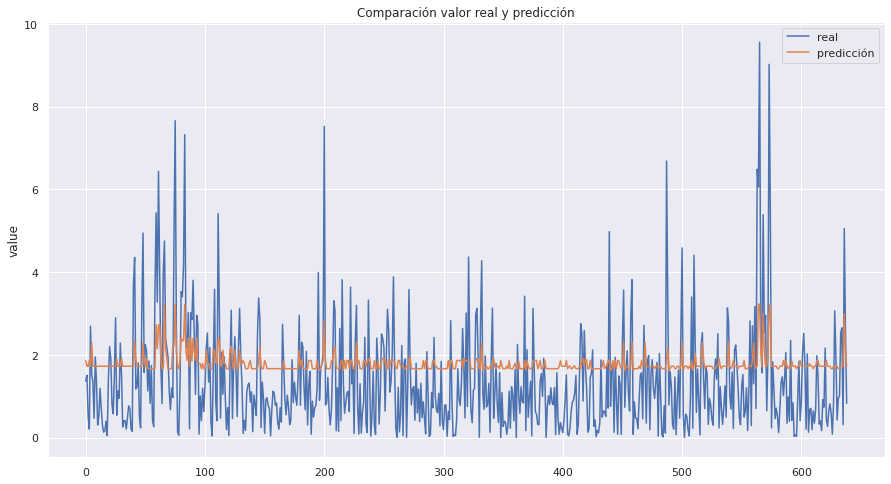

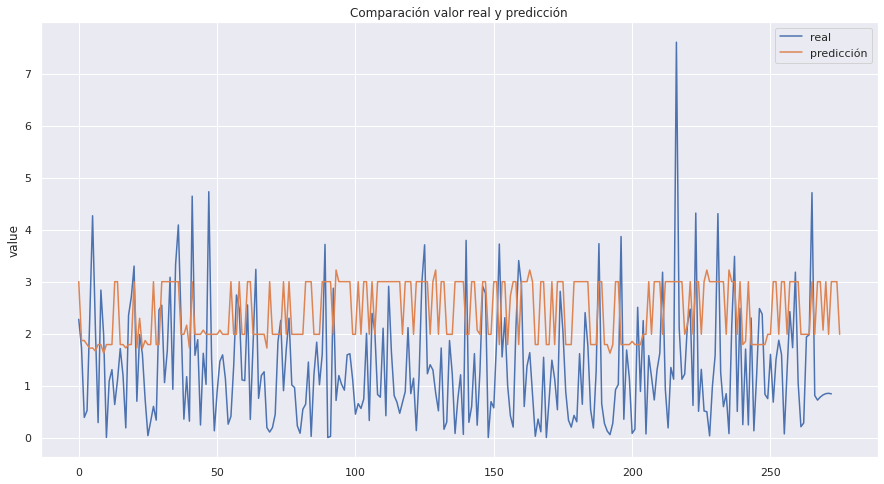

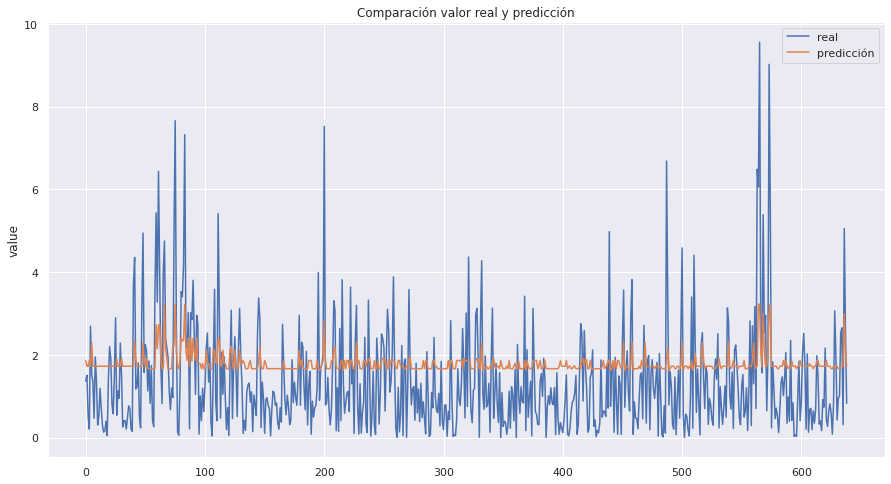

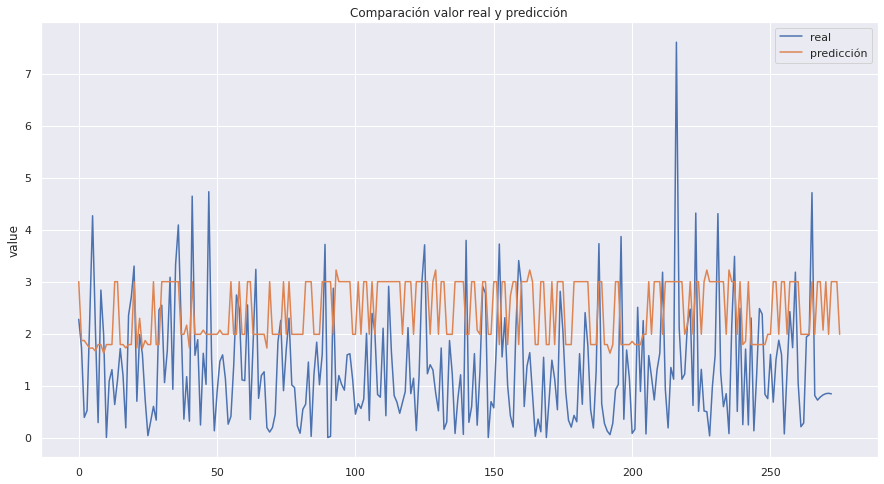

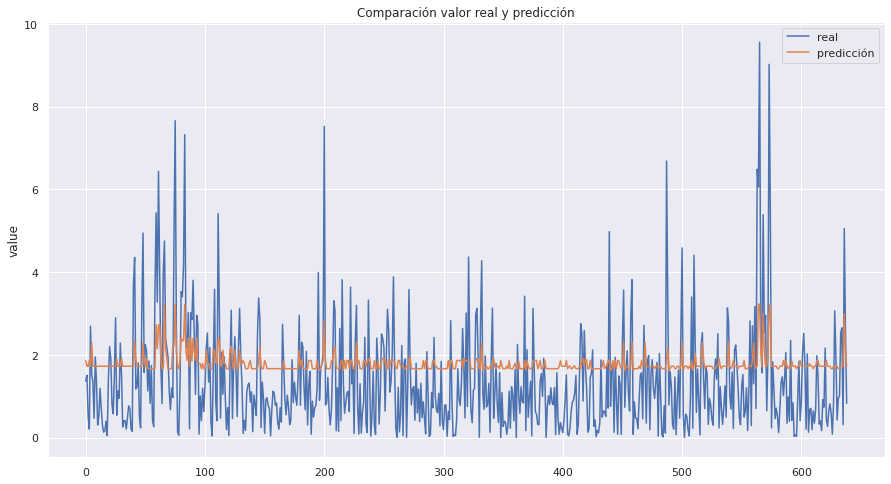

...

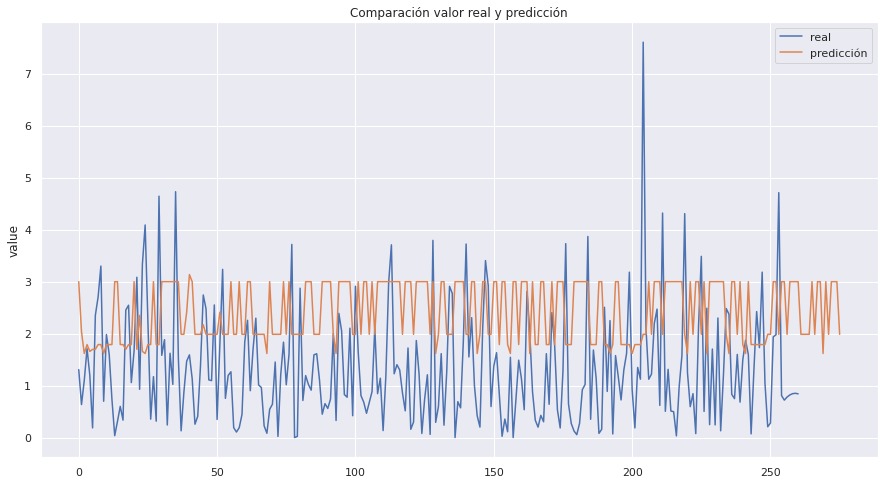

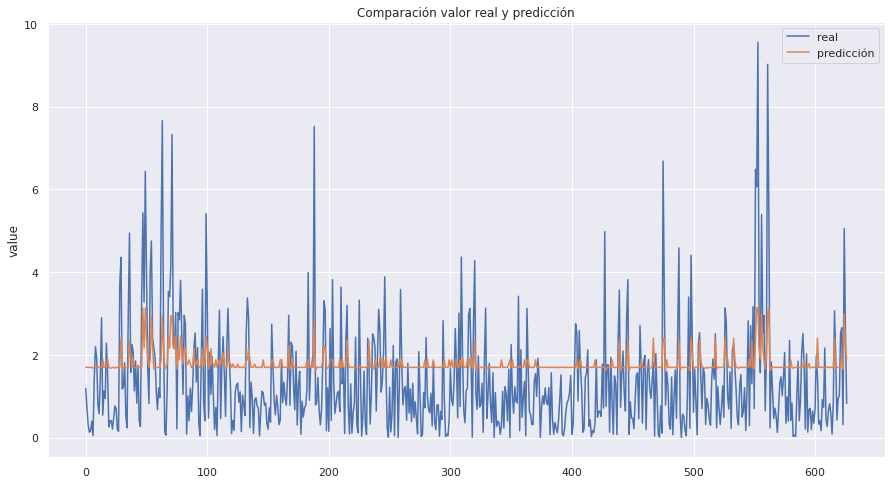

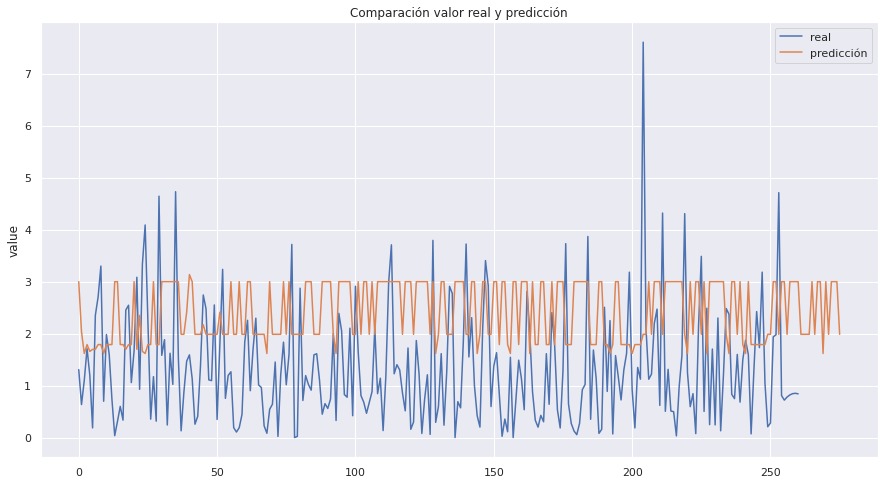

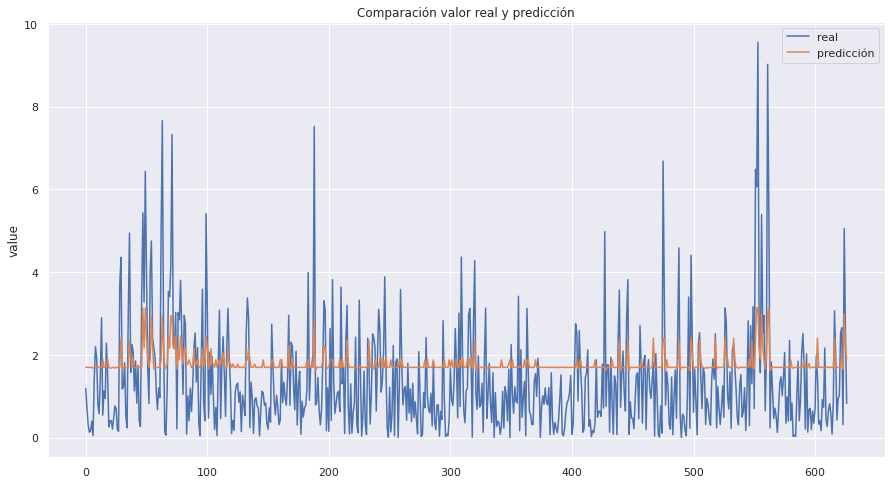

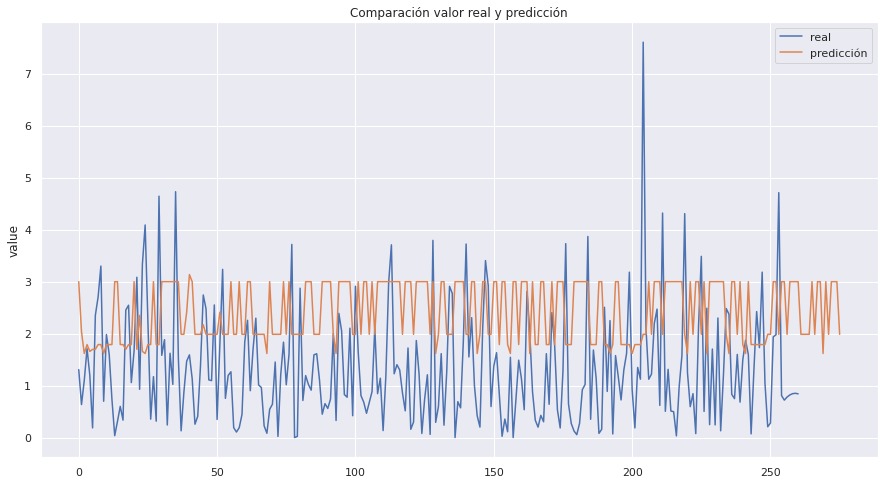

In [11]:
lags=[3,5,7,8,10,15]
n_estimators=[i for i in range(10,100,10)]
n_estimators.extend([200,300,500])
results_models={i:{} for i in lags}
for lg in lags:
    for est in n_estimators:
        results_models[lg][est]=Model(df_data.copy(),df_label.copy(),lg,est)